# ECP Group 05 Homework 02

## Josef Aktan, Noah Schneider, Zhan He

In [53]:
# In exercise 1, we implemented LUTs for approximate grayscale multiplication. 
# Metrics like SSIM and PSNR showed that SCDM8_41_LUT achieved the highest precision, followed by SCDM8_81_LUT, 
# with SCDM8_a4_LUT being the least precise. 
# In exercise 2, we implemented RGB image filtering, the approximate multiplier (especially SCDM8_41_LUT) caused only a slight loss of accuracy, 
# but the approximate adder led to a huge accuracy loss. 
# The main reason for this was a fundamental error in the adder's logic: a==0, b==0, c==0: s=0 c_out=1
# This critical flaw severely corrupted the final calculation results.

### 1. Grayscale Image Multiplication

In [52]:
# !pip install scikit-image

In [1]:
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from skimage.metrics import structural_similarity as ssim
from math import log10

# Read imgs
fruits = io.imread("fruits.png")
peppers = io.imread("peppers.tiff")

# Read LUTs
LUT0 = pd.read_excel("Approximate Multiplier LUTs/SCDM8_41_LUT.xlsx")
LUT1 = pd.read_excel("Approximate Multiplier LUTs/SCDM8_81_LUT.xlsx")
LUT2 = pd.read_excel("Approximate Multiplier LUTs/SCDM8_a4_LUT.xlsx")

# Gray scale
fruits = (0.299 * np.array(fruits[:,:,0])) + (0.587 * np.array(fruits[:,:,1])) + (0.114 * np.array(fruits[:,:,2]))
peppers = (0.299 * np.array(peppers[:,:,0])) + (0.587 * np.array(peppers[:,:,1])) + (0.114 * np.array(peppers[:,:,2]))

# Scale range
fruits = np.floor(fruits / 2).astype(int)
peppers = np.floor(peppers / 2).astype(int)

In [2]:
def LUT_mul (a, b, LUT):
    assert a.shape == b.shape, "matrices must have same dimensions"
    res = np.zeros(a.shape)
    for i in range(a.shape[0]):
        for j in range(a.shape[1]):
            # Get value from LUT with shifted indices
            res[i][j] = LUT[a[i][j]+128][b[i][j]+128]
    return res

# Multiply images
exact = fruits * peppers
approx_0 = LUT_mul(fruits, peppers, LUT0)
approx_1 = LUT_mul(fruits, peppers, LUT1)
approx_2 = LUT_mul(fruits, peppers, LUT2)

#### Structural Similarity Index

In [29]:
exact.dtype

dtype('int64')

In [30]:
approx_0.dtype  # need to convert

dtype('float64')

In [31]:
exact.max() 

np.int64(14224)

In [32]:
127 * 127

16129

In [33]:
data_range = 16129  # (127-0) * (127-0)  possibly max: 127; possibly min: 0
ssi_0 = ssim(exact, approx_0.astype('int64'), data_range=data_range)
print(ssi_0)
ssi_1 = ssim(exact, approx_1.astype('int64'), data_range=data_range)
print(ssi_1)
ssi_2 = ssim(exact, approx_2.astype('int64'), data_range=data_range)
print(ssi_2)

0.9998381554268467
0.9632893418771586
0.7129050666325134


#### Maximum error distance

In [34]:
# Maximum error distance
med_0 = (exact - approx_0).max()
print(med_0)
med_1 = (exact - approx_1).max()
print(med_1)
med_2 = (exact - approx_2).max()
print(med_2)

44.0
704.0
3276.0


#### Mean squared error

In [35]:
# Mean squared error
mse_0 = np.mean((exact - approx_0)**2)
print(mse_0)
mse_1 = np.mean((exact - approx_1)**2)
print(mse_1)
mse_2 = np.mean((exact - approx_2)**2)
print(mse_2)

122.1685791015625
71205.02600097656
1614610.6627197266


#### Peak signal to noise ratio

In [36]:
# Peak signal to noise ratio
psnr_0 = 10 * log10((exact.max()**2) /mse_0)
print(psnr_0)
psnr_1 = 10 * log10((exact.max()**2) /mse_1)
print(psnr_1)
psnr_2 = 10 * log10((exact.max()**2) /mse_2)
print(psnr_2)

62.19083964467469
34.53532837892763
20.97975671060132


#### Visualization

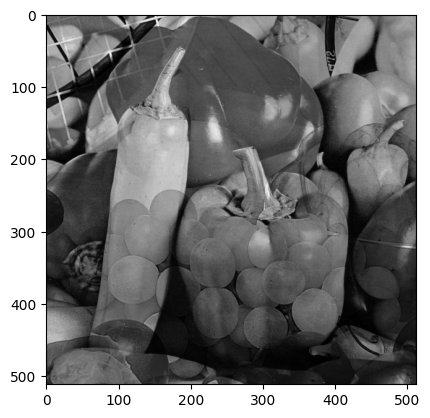

In [37]:
plt.imshow(exact, cmap="gray")

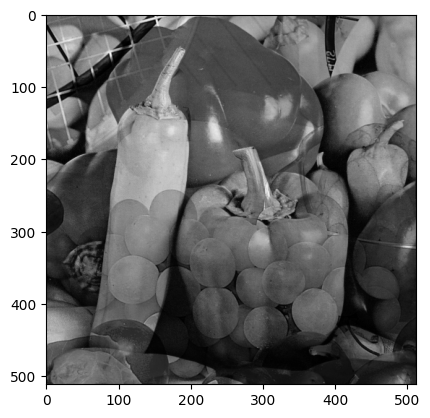

In [38]:
plt.imshow(approx_0, cmap="gray")

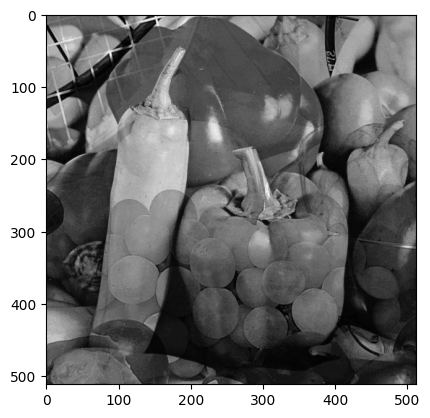

In [39]:
plt.imshow(approx_1, cmap="gray")

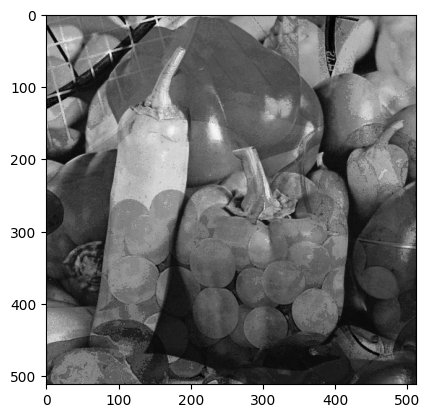

In [40]:
plt.imshow(approx_2, cmap="gray")

### 2. Perform low-pass filtering

#### filter definition

In [3]:
f1 = [
    [1, 1, 1],
    [1, 1, 1],
    [1, 1, 1]
]
f1 = 1/9 *np.array(f1)

#again a normalized gaussian filter
f2 = [
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
] 
f2 = 1/16 *np.array(f2)

f3 = [
    [1, 4,  7,  4,  1],
    [4, 16, 26, 16, 4],
    [7, 26, 41, 26, 7],
    [4, 16, 26, 16, 4],
    [1, 4,  7,  4,  1]
]
f3 = 1/273 *np.array(f3)

f4 = [
    [0, -1,  0],
    [-1, 4, -1],
    [0, -1,  0]
]
f4 = np.array(f4)

f5 = [
    [-1, 0,  -1],
    [0,  4,   0],
    [-1, 0,  -1]
]
f5 = np.array(f5)

f6 = [
    [1,   2,   1],
    [0,   0,   0],
    [-1, -2,  -1]
]
f6 = np.array(f6)

In [5]:
# Read imgs again
fruits = io.imread("fruits.png")

#### (a) Using the exact adder and exact multiplier.

In [22]:
filter_list = [f1, f2, f3, f4, f5, f6]
filtered_result_list = []

H, W, C = fruits.shape  #  (512, 512, 3)

for f in filter_list:
    kh, kw = f.shape  # kernel_shape
    ph, pw = kh // 2, kw // 2  # padding calc
    # print("ph=", ph, "pw=", pw)
    
    filtered_result = np.zeros((H, W, 3), dtype=np.float32)
    for channel in range(3):
        image = fruits[:, :, channel]
        
        # auto padding
        padded = np.pad(image, ((ph, ph), (pw, pw)), mode='constant', constant_values=0)
        
        # filtering
        for row in range(H):
            for column in range(W):
                region = padded[row:row+kh, column:column+kw]
                filtered_result[row, column, channel] = np.sum(region * f)  ### exact adder
    
    filtered_result_list.append(filtered_result)
    # print(f"filter shape = {f.shape}, output shape = {filtered_result.shape}")

##### original RGB image

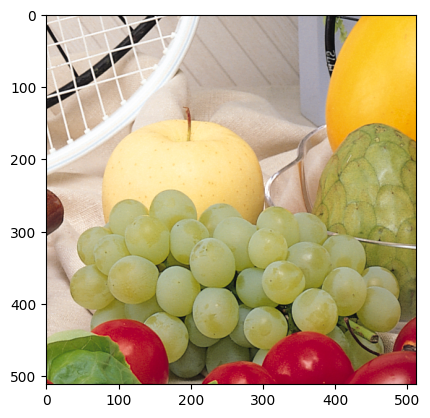

In [23]:
plt.imshow(fruits)

#### (a) Visualization

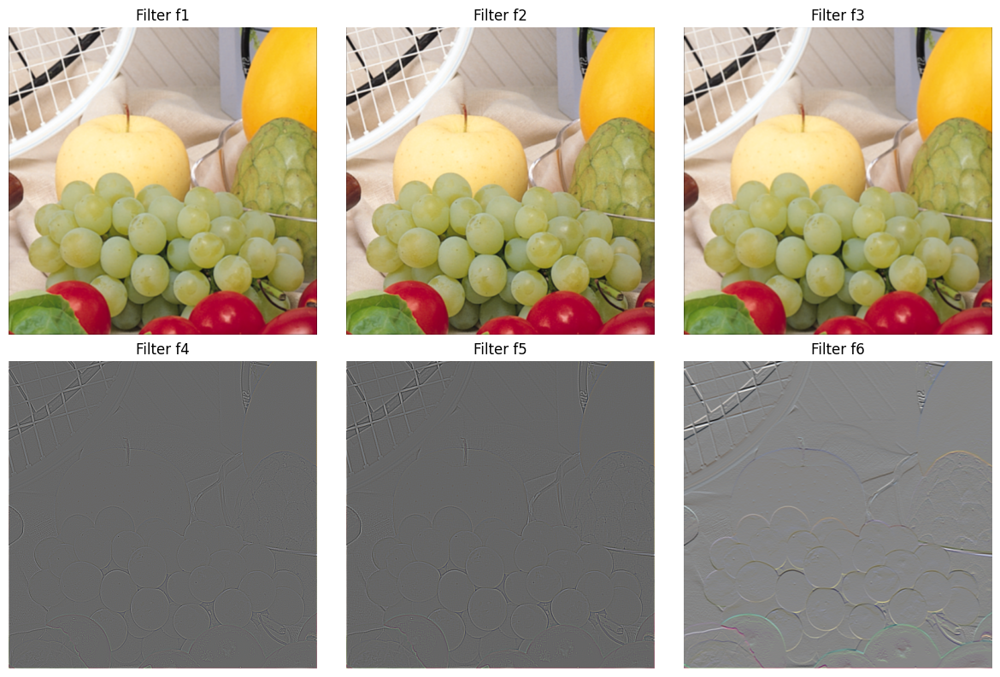

In [24]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # easy to iterate

for i, ax in enumerate(axes):
    img = filtered_result_list[i]
    img_norm = (img - img.min()) / (img.max() - img.min())  # rescale pixel value (rgb)
    ax.imshow(img_norm)
    ax.set_title(f"Filter f{i+1}")
    ax.axis('off')

plt.tight_layout()
plt.show()

# img = filtered_result_list[2]
# plt.imshow((img - img.min()) / (img.max() - img.min()))

In [25]:
fruits.min()

np.uint8(0)

In [26]:
filtered_result_list[0].max()

np.float32(255.0)

##### SSIM

In [27]:
for i in range(len(filtered_result_list)):
    ssi_f = ssim(fruits, filtered_result_list[i].astype('uint8'), channel_axis=-1)
    print(ssi_f)

0.8990037096005117
0.9353065086444455
0.8954212958168183
-0.046259673974979265
-0.04110258948635573
0.006145564924216795


##### MED

In [28]:
for i in range(len(filtered_result_list)):
    med_f = (fruits - filtered_result_list[i]).max()
    print(med_f)

139.66666
109.8125
129.70331
390.0
540.0
1274.0


##### MSE

In [29]:
for i in range(len(filtered_result_list)):
    mse_f = np.mean((fruits - filtered_result_list[i])**2)
    print(mse_f)

64.59788
38.65166
68.45756
27866.37
28421.164
33998.203


##### PSNR

In [30]:
for i in range(len(filtered_result_list)):
    psnr_f = 10 * log10((filtered_result_list[i].max()**2) / mse_f)
    print(psnr_f)

2.81624404241796
2.81624404241796
2.81624404241796
8.785599483729666
12.267357728422535
14.10167267579727


#### (b) Using the exact adder and approximate multipliers

##### scaling the filter

In [7]:
def filter_approx(fvalue, LUT, scale_fvalue=32.0):
    fvalue_idx = np.clip(np.round(fvalue * scale_fvalue).astype(int), -128, 127)
    return fvalue_idx

In [200]:
# example
f4_ = filter_approx(f4, 1)

In [201]:
f4_

array([[  0, -32,   0],
       [-32, 127, -32],
       [  0, -32,   0]])

In [141]:
fruits_2 = np.floor(fruits / 2).astype(int)
filtered_result_list_2_LUT0 = []
filtered_result_list_2_LUT2 = []

H, W, C = fruits_2.shape  #  (512, 512, 3)

for f in filter_list:
    kh, kw = f.shape  # kernel_shape
    ph, pw = kh // 2, kw // 2  # padding calc
    # print("ph=", ph, "pw=", pw)
    
    filtered_result_1 = np.zeros((H, W, 3), dtype=np.int64)
    filtered_result_2 = np.zeros((H, W, 3), dtype=np.int64)
    for channel in range(3):
        image = fruits_2[:, :, channel]
        
        # auto padding
        padded = np.pad(image, ((ph, ph), (pw, pw)), mode='constant', constant_values=0)
        
        # filtering
        for row in range(H):
            for column in range(W):
                region = padded[row:row+kh, column:column+kw]
                filtered_result_1[row, column, channel] = np.sum(LUT_mul(region, filter_approx(f, LUT0), LUT0))
                filtered_result_2[row, column, channel] = np.sum(LUT_mul(region, filter_approx(f, LUT2), LUT2))
    
    filtered_result_list_2_LUT0.append(filtered_result_1)
    filtered_result_list_2_LUT2.append(filtered_result_2)
    # print(f"filter shape = {f.shape}, output shape = {filtered_result.shape}")

##### LUT0 

##### Visualization

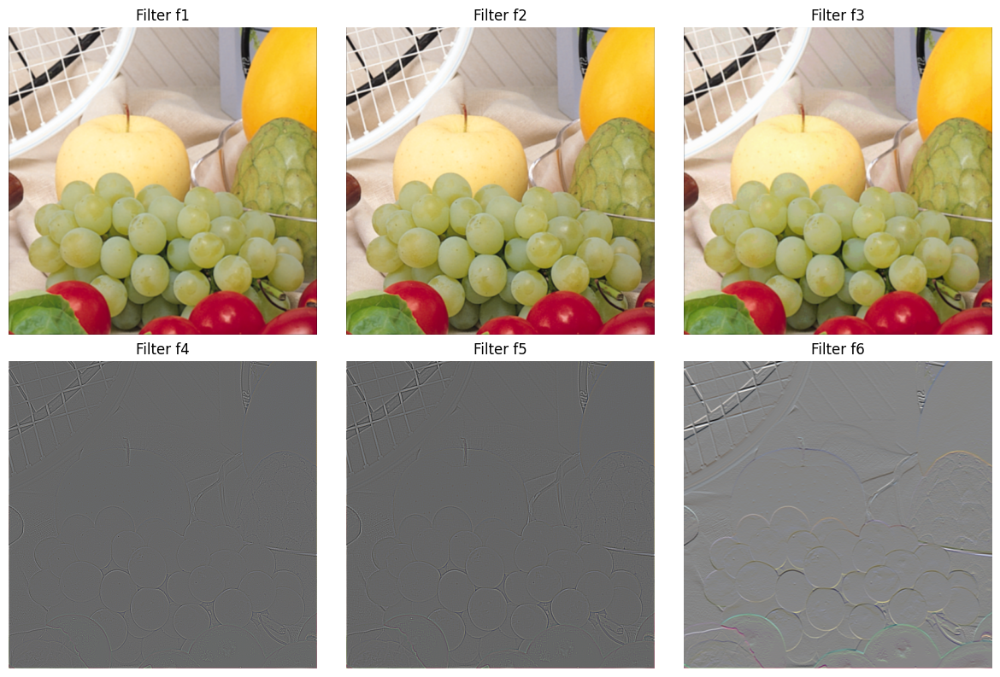

In [142]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # easy to iterate

for i, ax in enumerate(axes):
    img = filtered_result_list_2_LUT0[i]
    img_norm = (img - img.min()) / (img.max() - img.min())  # rescale pixel value (rgb)
    ax.imshow(img_norm)
    ax.set_title(f"Filter f{i+1}")
    ax.axis('off')

plt.tight_layout()
plt.show()

##### SSIM

In [155]:
for i in range(len(filtered_result_list_2_LUT0)):
    ssi_f = ssim(fruits, (filtered_result_list_2_LUT0[i]/32).astype('uint8'), channel_axis=-1)  # rescale: divide by 32
    print(ssi_f)

0.6982976971141802
0.6585072794722486
0.5772514757231763
-0.028884835821543373
-0.03328878176660507
0.005636829950814968


##### MED

In [156]:
for i in range(len(filtered_result_list_2_LUT0)):
    med_f = (fruits - filtered_result_list_2_LUT0[i]/32).max()  # rescale: divide by 32
    print(med_f)

188.875
180.9375
195.0
300.25
323.5625
763.0


##### MSE

In [157]:
for i in range(len(filtered_result_list_2_LUT0)):
    mse_f = np.mean((fruits - filtered_result_list_2_LUT0[i]/32)**2)
    print(mse_f)

5501.589468578498
7118.476610605915
8731.435162914297
28826.348354025435
28764.71310981487
29532.45117823283


##### PSNR

In [158]:
for i in range(len(filtered_result_list_2_LUT0)):
    psnr_f = 10 * log10(((filtered_result_list_2_LUT0[i].max()/32)**2) / mse_f)
    print(psnr_f)

-1.6038700787264544
-2.6269205276740806
-3.7380443107137356
3.2318861262850787
6.761691661772463
8.683342664529025


##### LUT2

##### Visualization

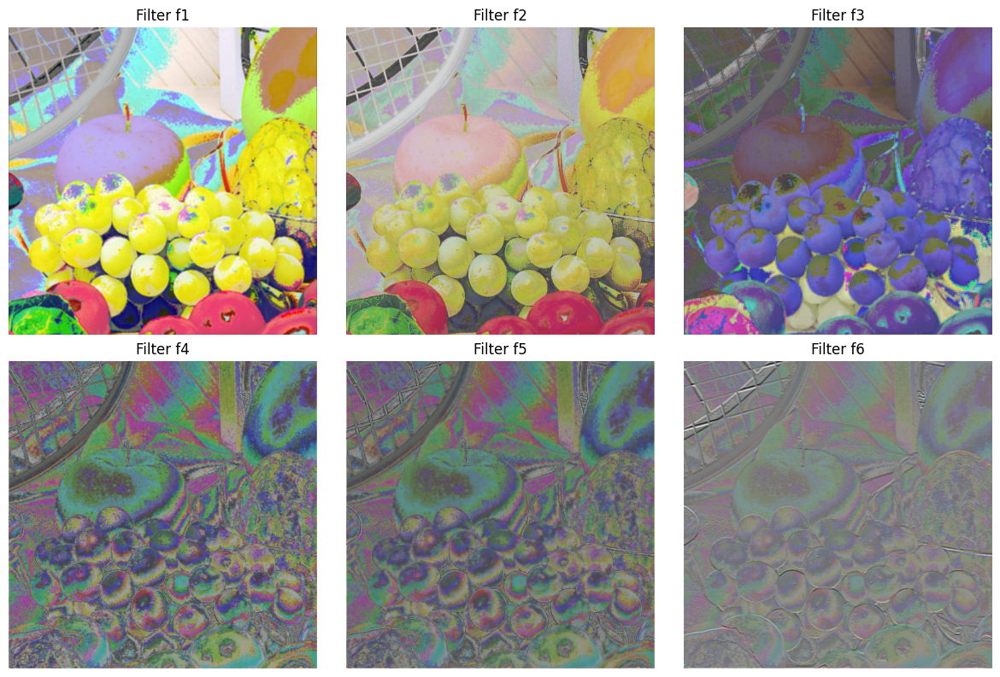

In [148]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # easy to iterate

for i, ax in enumerate(axes):
    img = filtered_result_list_2_LUT2[i]
    img_norm = (img - img.min()) / (img.max() - img.min())  # rescale pixel value (rgb)
    ax.imshow(img_norm)
    ax.set_title(f"Filter f{i+1}")
    ax.axis('off')

plt.tight_layout()
plt.show()

##### SSIM

In [151]:
for i in range(len(filtered_result_list_2_LUT2)):
    ssi_f = ssim(fruits, (filtered_result_list_2_LUT2[i]/32).astype('uint8'), channel_axis=-1)  # rescale: divide by 32
    print(ssi_f)

0.5580960726170477
0.6001345721687699
0.4615051830516232
0.04145742591406624
0.032789150938003636
0.040337527298717195


##### MED

In [152]:
for i in range(len(filtered_result_list_2_LUT2)):
    med_f = (fruits - filtered_result_list_2_LUT2[i]/32).max()  # rescale: divide by 32
    print(med_f)

364.875
359.5
656.34375
634.6875
634.375
978.0


##### MSE

In [153]:
for i in range(len(filtered_result_list_2_LUT2)):
    mse_f = np.mean((fruits - filtered_result_list_2_LUT2[i]/32)**2)
    print(mse_f)

61528.65885029236
72016.58267826338
300808.4575175171
169367.84790587798
168713.9842134354
137383.53927230835


##### PSNR

In [154]:
for i in range(len(filtered_result_list_2_LUT2)):
    psnr_f = 10 * log10(((filtered_result_list_2_LUT2[i].max()/32)**2) / mse_f)
    print(psnr_f)

-19.98601775820756
-13.755935093230132
-0.40004856089933793
-14.539650912910657
-6.951062247866162
-1.4407540432486368


#### (c) Using the approximate adders and the exact multiplier

In [ ]:
# Truth table for an approximate adder

# A B C S C_out 
# 0 0 0 0  1 
# 0 0 1 1  0
# 0 1 0 1  0
# 0 1 1 0  1
# 1 0 0 1  0
# 1 0 1 0  1
# 1 1 0 1  1
# 1 1 1 1  1

##### Approximate adder definition

In [8]:
def ApproxAdder(a, b, c):
    if a==0 and b==0 and c==0:
        s=0
        c_out=1  # exact: 0
    elif a==0 and b==0 and c==1:
        s=1
        c_out=0
    elif a==0 and b==1 and c==0:
        s=1
        c_out=0
    elif a==0 and b==1 and c==1:
        s=0
        c_out=1
    elif a==1 and b==0 and c==0:
        s=1
        c_out=0
    elif a==1 and b==0 and c==1:
        s=0
        c_out=1
    elif a==1 and b==1 and c==0:
        s=1  # exact: 0
        c_out=1
    elif a==1 and b==1 and c==1:
        s=1
        c_out=1
    return s, c_out

In [10]:
def MyNbitAdder(a, b):
    # convert to binary and cut off the first two indices (they dont belong to the number but indicate that it is binary)
    a = int(a)
    b = int(b)
    a_bin, b_bin = bin(a)[2:], bin(b)[2:]
    
    # reverse order of bytes for the adder
    rev_a, rev_b = list(a_bin[::-1]), list(b_bin[::-1])
    
    # We want to make the two bytes equal length such that we can add
    # --> add zeros to the shortest list until it is the same as the longest
    rev_a = rev_a + max(0, len(rev_b) - len(rev_a)) * [0]
    rev_b = rev_b + max(0, len(rev_a) - len(rev_b)) * [0]
    
    carry_over = 0
    total_sum = 0
    count = 0

    #############################################
    # all bits use ApproxAdder
    #############################################
    
    # we want to do a bitwise addition
    for index, (bit1, bit2) in enumerate(zip(rev_a, rev_b)):
        # use approx_adder for all bits
        sum_element, carry_over = ApproxAdder(int(bit1), int(bit2), int(carry_over))
        count += 1
        total_sum += pow(2, index) * sum_element

    total_sum += pow(2, index + 1) * carry_over
    return total_sum, count

##### A simple check —— loss is huge

In [11]:
MyNbitAdder(100, 100)  

(238, 7)

In [120]:
(region * f)

array([[90, 82,  0],
       [90, 88,  0],
       [ 0,  0,  0]], dtype=uint8)

In [121]:
m = (region * f)
sum = 0 
for i in range(3):
    for j in range(3):
        sum = MyNbitAdder(sum, m[i][j])[0]

In [123]:
sum  # ground true: 350

1672

##### There is no negative value in low pass filter

In [46]:
filtered_result_list_3 = []
filter_list_low = [f1, f2, f3]
H, W, C = fruits.shape  #  (512, 512, 3)

for f in filter_list_low:
    kh, kw = f.shape  # kernel_shape
    ph, pw = kh // 2, kw // 2  # padding calc
    
    filtered_result = np.zeros((H, W, 3), dtype=np.int64)
    for channel in range(3):
        image = fruits[:, :, channel]
        
        # auto padding
        padded = np.pad(image, ((ph, ph), (pw, pw)), mode='constant', constant_values=0)
        
        # filtering
        for row in range(H):
            for column in range(W):
                region = padded[row:row+kh, column:column+kw]
                filtered_region = region * f
                for i in range(filtered_region.shape[0]):
                    for j in range(filtered_region.shape[1]):
                        filtered_result[row, column, channel] = MyNbitAdder(
                                                                filtered_result[row, column, channel], 
                                                                filtered_region[i][j]
                                                               )[0]
                # filtered_result[row, column, channel] = np.sum(region * f)
    
    filtered_result_list_3.append(filtered_result)
    # print(f"filter shape = {f.shape}, output shape = {filtered_result.shape}")

##### reconstruct the high pass filter, in order to ensure that no nagative value exist

##### f = fp - fn

In [12]:
f4p = np.array([
    [0, 0, 0],
    [0, 4, 0],
    [0, 0, 0]
])
f4n = np.array([
    [0, 1, 0],
    [1, 0, 1],
    [0, 1, 0]
])
f5p = np.array([
    [0, 0, 0],
    [0, 4, 0],
    [0, 0, 0]
])
f5n = np.array([
    [1, 0, 1],
    [0, 0, 0],
    [1, 0, 1]
])
f6p = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [0, 0, 0]
])
f6n = np.array([
    [0, 0, 0],
    [0, 0, 0],
    [1, 2, 1]
])

In [47]:
filter_list_high = [(f4p, f4n), (f5p, f5n), (f6p, f6n)]
filtered_result_1 = np.zeros((H, W, 3), dtype=np.int64)
filtered_result_2 = np.zeros((H, W, 3), dtype=np.int64)
for f in range(3):
    kh, kw = filter_list_high[f][0].shape  # kernel_shape
    ph, pw = kh // 2, kw // 2  # padding calc
    # print("ph=", ph, "pw=", pw)
    fp = filter_list_high[f][0]
    fn = filter_list_high[f][1]   
    filtered_result = np.zeros((H, W, 3), dtype=np.int64)
    for channel in range(3):
        image = fruits[:, :, channel]
        # auto padding
        padded = np.pad(image, ((ph, ph), (pw, pw)), mode='constant', constant_values=0)
        
        # filtering
        for row in range(H):
            for column in range(W):
                region = padded[row:row+kh, column:column+kw]
                filtered_region_1 = region * fp
                filtered_region_2 = region * fn
                for i in range(filtered_region_1.shape[0]):
                    for j in range(filtered_region_1.shape[1]):
                        filtered_result_1[row, column, channel] = MyNbitAdder(
                                                                filtered_result_1[row, column, channel], 
                                                                filtered_region_1[i][j]
                                                               )[0]
                        filtered_result_2[row, column, channel] = MyNbitAdder(
                                                                filtered_result_2[row, column, channel], 
                                                                filtered_region_2[i][j]
                                                               )[0]
    filtered_result = filtered_result_1 - filtered_result_2
    filtered_result_list_3.append(filtered_result)

##### Visualization

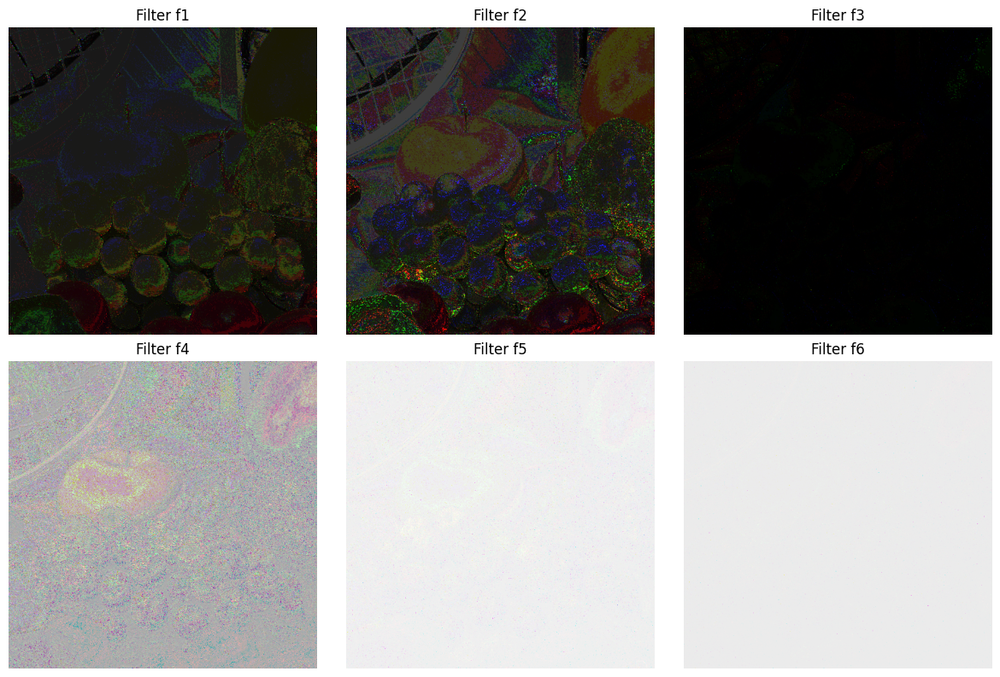

In [136]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # easy to iterate

for i, ax in enumerate(axes):
    img = filtered_result_list_3[i]
    img_norm = (img - img.min()) / (img.max() - img.min())  # rescale pixel value (rgb)
    ax.imshow(img_norm)
    ax.set_title(f"Filter f{i+1}")
    ax.axis('off')

plt.tight_layout()
plt.show()

##### SSIM

In [137]:
for i in range(len(filtered_result_list_3)):
    ssi_f = ssim(fruits, filtered_result_list_3[i].astype('uint8'), channel_axis=-1)
    print(ssi_f)

0.24359899930659434
0.06143165261092528
0.027169925382198614
0.020559796492845735
0.023011265349871888
0.017284375025018128


##### MED

In [138]:
for i in range(len(filtered_result_list_3)):
    med_f = (fruits - filtered_result_list_3[i]).max()
    print(med_f)

76
57
24
37075
19142276
3680398335


##### MSE

In [139]:
for i in range(len(filtered_result_list_3)):
    mse_f = np.mean((fruits - filtered_result_list_3[i])**2)
    print(mse_f)

828794.3109169006
525732.2808189392
73134220353.4916
30703130.36603673
204388341377.9912
882916265976784.1


##### PSNR

In [140]:
for i in range(len(filtered_result_list_3)):
    psnr_f = 10 * log10((filtered_result_list_3[i].max()**2) / mse_f)
    print(psnr_f)

-70.01976965105827
-76.04129610864919
-3.8049583855036047
-64.37161778115554
-27.62819836824642
20.276504290627578


#### (d) Using the approximate adders and approximate multipliers

##### low pass filter (f1-f3)

In [37]:
filtered_result_list_4_LUT0 = []
filtered_result_list_4_LUT1 = []

H, W, C = fruits_2.shape  #  (512, 512, 3)

for f in filter_list_low:
    kh, kw = f.shape  # kernel_shape
    ph, pw = kh // 2, kw // 2  # padding calc
    # print("ph=", ph, "pw=", pw)
    
    filtered_result_1 = np.zeros((H, W, 3), dtype=np.int64)
    filtered_result_2 = np.zeros((H, W, 3), dtype=np.int64)
    for channel in range(3):
        image = fruits_2[:, :, channel]
        
        # auto padding
        padded = np.pad(image, ((ph, ph), (pw, pw)), mode='constant', constant_values=0)

        for row in range(H):
            for column in range(W):
                region = padded[row:row+kh, column:column+kw]
                filtered_region_1 = LUT_mul(region, filter_approx(f, LUT0), LUT0)
                filtered_region_2 = LUT_mul(region, filter_approx(f, LUT1), LUT1)
                for i in range(filtered_region_1.shape[0]):
                    for j in range(filtered_region_1.shape[1]):
                        filtered_result_1[row, column, channel] = MyNbitAdder(
                                                                  filtered_result_1[row, column, channel], 
                                                                  filtered_region_1[i][j]
                                                                  )[0]
                        filtered_result_2[row, column, channel] = MyNbitAdder(
                                                                  filtered_result_2[row, column, channel], 
                                                                  filtered_region_2[i][j]
                                                                  )[0]
    
    filtered_result_list_4_LUT0.append(filtered_result_1)
    filtered_result_list_4_LUT1.append(filtered_result_2)

##### high pass filter (f4-f6)

In [42]:
filtered_result_1_LUT0 = np.zeros((H, W, 3), dtype=np.int64)
filtered_result_2_LUT0 = np.zeros((H, W, 3), dtype=np.int64)
filtered_result_1_LUT1 = np.zeros((H, W, 3), dtype=np.int64)
filtered_result_2_LUT1 = np.zeros((H, W, 3), dtype=np.int64)
for f in range(3):
    kh, kw = filter_list_high[f][0].shape  # kernel_shape
    ph, pw = kh // 2, kw // 2  # padding calc
    # print("ph=", ph, "pw=", pw)
    fp = filter_list_high[f][0]
    fn = filter_list_high[f][1] 

    filtered_result_LUT0 = np.zeros((H, W, 3), dtype=np.int64)
    filtered_result_LUT1 = np.zeros((H, W, 3), dtype=np.int64)
    for channel in range(3):
        image = fruits_2[:, :, channel]
        # auto padding
        padded = np.pad(image, ((ph, ph), (pw, pw)), mode='constant', constant_values=0)
        
        # filtering
        for row in range(H):
            for column in range(W):
                region = padded[row:row+kh, column:column+kw]
                filtered_region_1_LUT0 = LUT_mul(region, filter_approx(fp, LUT0, scale_fvalue=1), LUT0)
                filtered_region_2_LUT0 = LUT_mul(region, filter_approx(fn, LUT0, scale_fvalue=1), LUT0)
                filtered_region_1_LUT1 = LUT_mul(region, filter_approx(fp, LUT1, scale_fvalue=1), LUT1)
                filtered_region_2_LUT1 = LUT_mul(region, filter_approx(fn, LUT1, scale_fvalue=1), LUT1)

                for i in range(filtered_region_1_LUT0.shape[0]):
                    for j in range(filtered_region_1_LUT0.shape[1]):
                        filtered_result_1_LUT0[row, column, channel] = MyNbitAdder(
                                                                       filtered_result_1_LUT0[row, column, channel], 
                                                                       filtered_region_1_LUT0[i][j]
                                                                      )[0]
                        filtered_result_2_LUT0[row, column, channel] = MyNbitAdder(
                                                                       filtered_result_2_LUT0[row, column, channel], 
                                                                       filtered_region_2_LUT0[i][j]
                                                                      )[0]
                        filtered_result_1_LUT1[row, column, channel] = MyNbitAdder(
                                                                       filtered_result_1_LUT1[row, column, channel], 
                                                                       filtered_region_1_LUT1[i][j]
                                                                      )[0]
                        filtered_result_2_LUT1[row, column, channel] = MyNbitAdder(
                                                                       filtered_result_2_LUT1[row, column, channel], 
                                                                       filtered_region_2_LUT1[i][j]
                                                                      )[0]
    filtered_result_LUT0 = filtered_result_1_LUT0 - filtered_result_2_LUT0
    filtered_result_LUT1 = filtered_result_1_LUT1 - filtered_result_2_LUT1
    filtered_result_list_4_LUT0.append(filtered_result_LUT0)
    filtered_result_list_4_LUT1.append(filtered_result_LUT1)

##### LUT0

##### Visualization

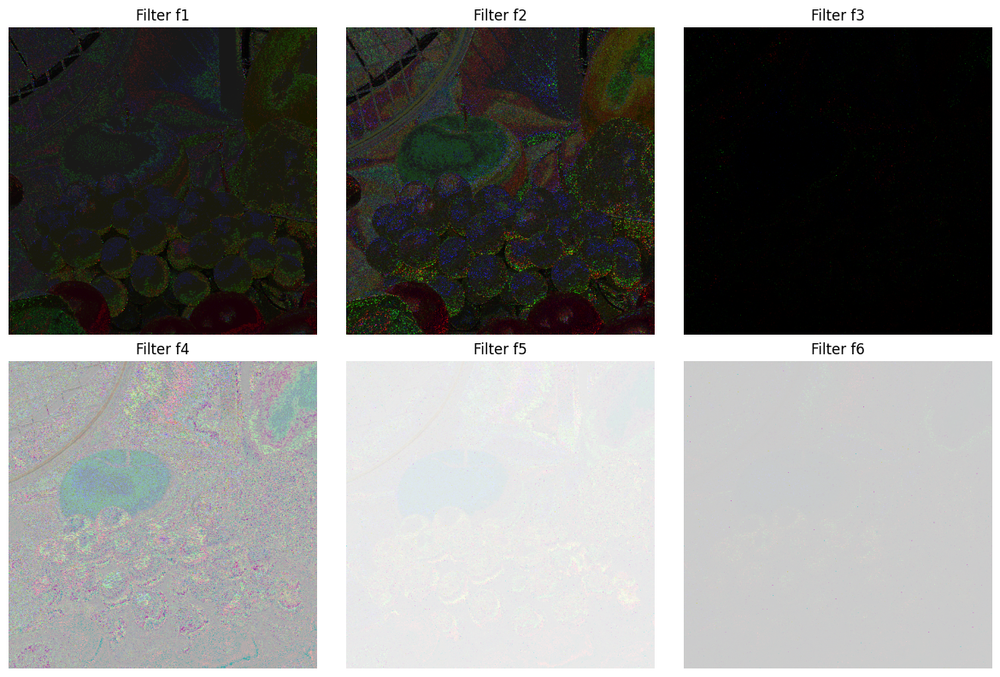

In [43]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # easy to iterate

for i, ax in enumerate(axes):
    img = filtered_result_list_4_LUT0[i]
    img_norm = (img - img.min()) / (img.max() - img.min())  # rescale pixel value (rgb)
    ax.imshow(img_norm)
    ax.set_title(f"Filter f{i+1}")
    ax.axis('off')

plt.tight_layout()
plt.show()

##### SSIM

In [44]:
for i in range(len(filtered_result_list_4_LUT0)):
    ssi_f = ssim(fruits, (filtered_result_list_4_LUT0[i]/32).astype('uint8'), channel_axis=-1)  # rescale: divide by 32
    print(ssi_f)

0.3262916525735941
0.051878124824286866
0.02359482644026571
0.023135365211528935
0.024662535684834078
0.026333791929732772


##### Maximum error distance

In [45]:
for i in range(len(filtered_result_list_4_LUT0)):
    med_f = (fruits - filtered_result_list_4_LUT0[i]/32).max()  # rescale: divide by 32
    print(med_f)

159.0625
135.0625
83.03125
807.03125
299249.59375
38346927.125


##### MSE

In [46]:
for i in range(len(filtered_result_list_4_LUT0)):
    mse_f = np.mean((fruits - filtered_result_list_4_LUT0[i]/32)**2)
    print(mse_f)

157190.81330843768
88741.51667057972
21536641798.200836
37007.05784975489
67532326.8485213
329389693680.45435


##### MED

In [47]:
for i in range(len(filtered_result_list_4_LUT0)):
    psnr_f = 10 * log10(((filtered_result_list_4_LUT0[i].max()/32)**2) / mse_f)
    print(psnr_f)

-41.757463803545036
-47.77817951865035
24.45653724149792
-66.21747512619312
-26.3533636683158
24.45563854747562


##### LUT1

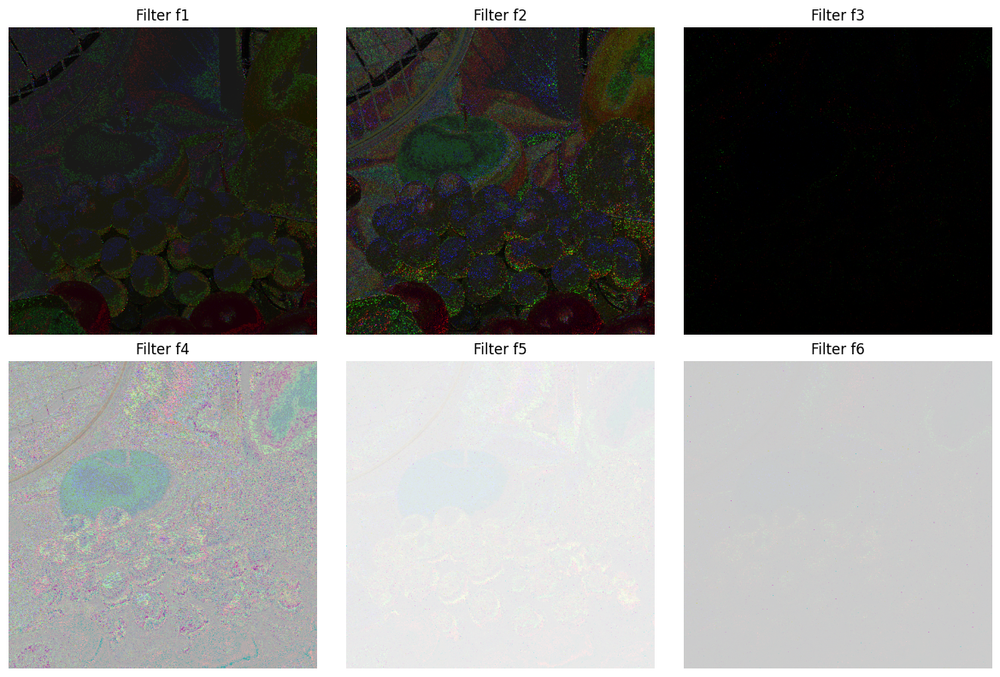

In [48]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # easy to iterate

for i, ax in enumerate(axes):
    img = filtered_result_list_4_LUT1[i]
    img_norm = (img - img.min()) / (img.max() - img.min())  # rescale pixel value (rgb)
    ax.imshow(img_norm)
    ax.set_title(f"Filter f{i+1}")
    ax.axis('off')

plt.tight_layout()
plt.show()

##### SSIM

In [49]:
for i in range(len(filtered_result_list_4_LUT1)):
    ssi_f = ssim(fruits, (filtered_result_list_4_LUT1[i]).astype('uint8'), channel_axis=-1)
    print(ssi_f)

0.09380608139323206
0.06964921652995851
0.022943862337713547
0.02245965875242957
0.02670182022351184
0.01917830035285252


##### MED

In [50]:
for i in range(len(filtered_result_list_4_LUT1)):
    med_f = (fruits - filtered_result_list_4_LUT1[i]).max() 
    print(med_f)

-27
-30
-7
18556
9571182
1227095158


##### MSE

In [51]:
for i in range(len(filtered_result_list_4_LUT1)):
    mse_f = np.mean((fruits - filtered_result_list_4_LUT1[i])**2)
    print(mse_f)

285782251.40695447
169540822.36361948
22066938978914.754
7605009.475580852
69040644983.09993
337292285886529.1


##### PSNR

In [52]:
for i in range(len(filtered_result_list_4_LUT1)):
    psnr_f = 10 * log10(((filtered_result_list_4_LUT1[i].max())**2) / mse_f)
    print(psnr_f)

-41.75742826048687
-47.77814397559218
24.45657278455609
-66.21743958313496
-26.353328125257633
24.455674090533787
